In [1]:
!git clone https://github.com/YogiDwiAndrian/pictor-ppe.git
%cd /content/pictor-ppe

Cloning into 'pictor-ppe'...
remote: Enumerating objects: 101, done.
remote: Counting objects: 100% (51/51), done.
remote: Compressing objects: 100% (37/37), done.
remote: Total 101 (delta 14), reused 44 (delta 9), pack-reused 50
Receiving objects: 100% (101/101), 64.19 MiB | 32.05 MiB/s, done.
Resolving deltas: 100% (21/21), done.
/content/pictor-ppe


Download or copy to your drive : https://drive.google.com/drive/folders/13tCdROHnS0c5VibW1VO8pOEj0rXEvvGj?usp=sharing 
or
 https://drive.google.com/drive/folders/17FesJvOXmnuhNHkVeFbbcaqLZeScCnwA?usp=sharing

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib as mpl

from tensorflow.keras.layers import Input

from src.yolo3.model import *
from src.yolo3.detect import *

from src.utils.image import *
from src.utils.datagen import *
from src.utils.fixes import *

fix_tf_gpu()

## **Helper functions**

In [4]:
# copy weight from my drive to colab
!cp /content/drive/MyDrive/pictor-ppe/* /content/pictor-ppe/model-data/weights

In [5]:
def prepare_model(approach):
    '''
    Prepare the YOLO model
    '''
    global input_shape, class_names, anchor_boxes, num_classes, num_anchors, model

    # shape (height, width) of the imput image
    input_shape = (416, 416)

    # class names
    if approach == 1:
        class_names = ['H', 'V', 'W']

    elif approach == 2:
        class_names  = ['W','WH','WV','WHV']

    elif approach == 3:
        class_names  = ['W']

    else:
        raise NotImplementedError('Approach should be 1, 2, or 3')

    # anchor boxes
    if approach == 1:
        anchor_boxes = np.array(
            [
            np.array([[ 76,  59], [ 84, 136], [188, 225]]) /32, # output-1 anchor boxes
            np.array([[ 25,  15], [ 46,  29], [ 27,  56]]) /16, # output-2 anchor boxes
            np.array([[ 5,    3], [ 10,   8], [ 12,  26]]) /8   # output-3 anchor boxes
            ],
            dtype='float64'
        )
    else:
        anchor_boxes = np.array(
            [
            np.array([[ 73, 158], [128, 209], [224, 246]]) /32, # output-1 anchor boxes
            np.array([[ 32,  50], [ 40, 104], [ 76,  73]]) /16, # output-2 anchor boxes
            np.array([[ 6,   11], [ 11,  23], [ 19,  36]]) /8   # output-3 anchor boxes
            ],
            dtype='float64'
        )

    # number of classes and number of anchors
    num_classes = len(class_names)
    num_anchors = anchor_boxes.shape[0] * anchor_boxes.shape[1]

    # input and output
    input_tensor = Input( shape=(input_shape[0], input_shape[1], 3) ) # input
    num_out_filters = ( num_anchors//3 ) * ( 5 + num_classes )        # output

    # build the model
    model = yolo_body(input_tensor, num_out_filters)

    # load weights 
    weight_path = f'/content/pictor-ppe/model-data/weights/pictor-ppe-v302-a{approach}-yolo-v3-weights.h5'
    model.load_weights( weight_path )

In [6]:
def get_detection(img):
    # save a copy of the img
    act_img = img.copy()

    # shape of the image
    ih, iw = act_img.shape[:2]

    # preprocess the image
    img = letterbox_image(img, input_shape)
    img = np.expand_dims(img, 0)
    image_data = np.array(img) / 255.

    # raw prediction from yolo model
    prediction = model.predict(image_data)

    # process the raw prediction to get the bounding boxes
    boxes = detection(
        prediction,
        anchor_boxes,
        num_classes,
        image_shape = (ih, iw),
        input_shape = (416,416),
        max_boxes = 10,
        score_threshold=0.3,
        iou_threshold=0.45,
        classes_can_overlap=False)

    # convert tensor to numpy
    boxes = boxes[0].numpy()

    # draw the detection on the actual image
    return draw_detection(act_img, boxes, class_names)

In [7]:
def plt_imshow(img):
    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.axis('off')

In [8]:
def detect_image():
  for i in range(11):
    # read the image
    img = cv2.imread( f'/content/pictor-ppe/extras/sample-images/{i}.JPG' )

    # resize
    img = letterbox_image(img, input_shape)

    # get the detection on the image
    img = get_detection(img)

    # show the image
    plt_imshow(img[:, :, ::-1])

In [9]:
def generate_video(approach):
  # custom name video
  nameVid = "ppe"
  vidCap = cv2.VideoCapture(f'/content/pictor-ppe/extras/sample-videos/input/{nameVid}.mp4')

  if (vidCap.isOpened() == False): 
      print("Error reading video file")

  fourcc = 'mp4v'  # output video codec
  fps = vidCap.get(cv2.CAP_PROP_FPS)
  w = int(vidCap.get(cv2.CAP_PROP_FRAME_WIDTH))
  h = int(vidCap.get(cv2.CAP_PROP_FRAME_HEIGHT))

  vid_writer = cv2.VideoWriter(f"/content/pictor-ppe/extras/sample-videos/output/{nameVid}_result_A{approach}.mp4", cv2.VideoWriter_fourcc(*fourcc), fps, (416,416))

  print("Generating Video...")
  while(True):
    ret, frame = vidCap.read() # reads the next frame
    
    if ret == True: 
      # resize
      img = letterbox_image(frame, input_shape)

      # get the detection on the image
      img = get_detection(img)
      vid_writer.write(img)

    else:
          break

  vidCap.release()
  vid_writer.release()

  print("The video was successfully saved")

## **Approach-1**

In [10]:
# prepare the model
prepare_model(approach=1)

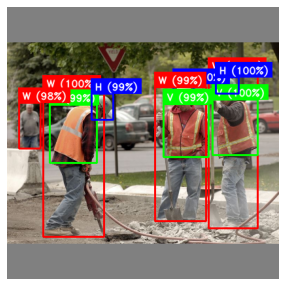

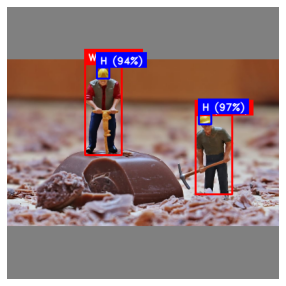

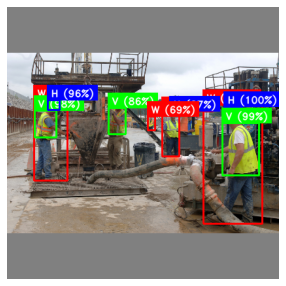

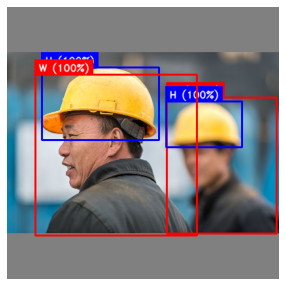

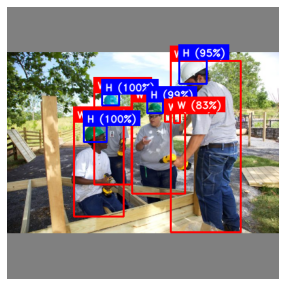

...

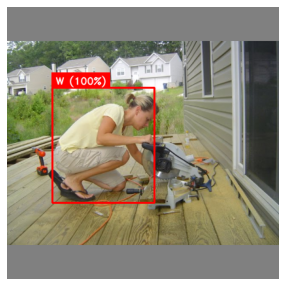

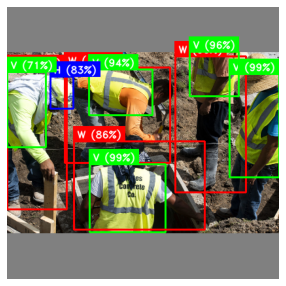

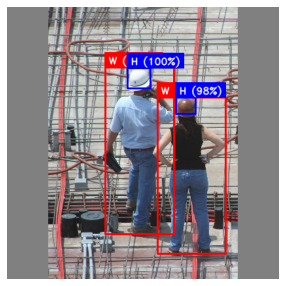

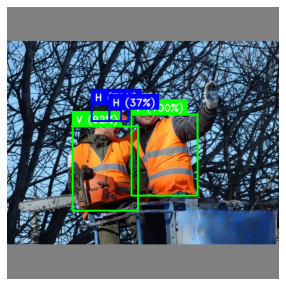

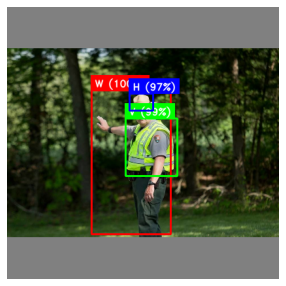

In [11]:
# image source
detect_image()

In [13]:
# video source
generate_video(1)

Generating Video...
The video was successfully saved


## **Approach-2**

In [14]:
# prepare the model
prepare_model(approach=2)

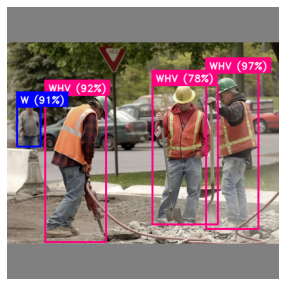

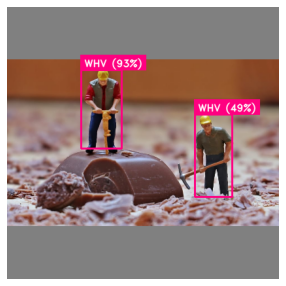

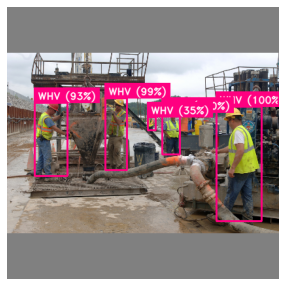

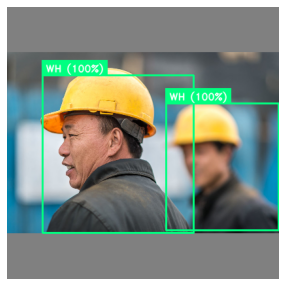

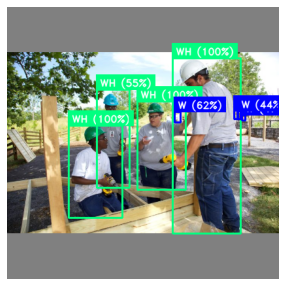

...

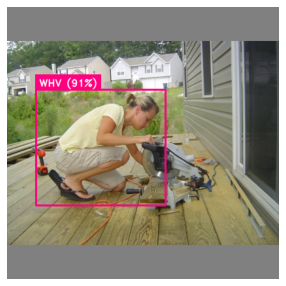

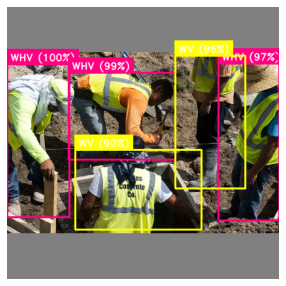

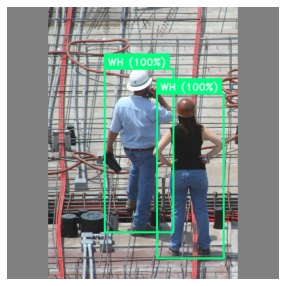

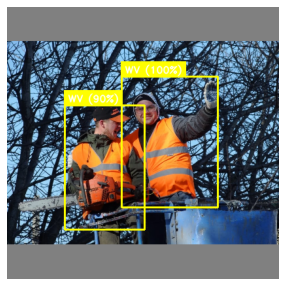

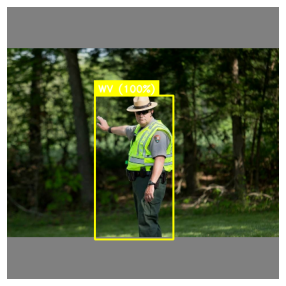

In [15]:
# prepare the model
detect_image()

In [16]:
# video source
generate_video(2)

Generating Video...
The video was successfully saved


## **Approach-3**

In [17]:
# prepare the model
prepare_model(approach=3)

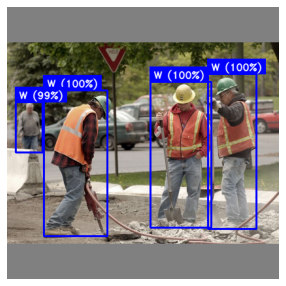

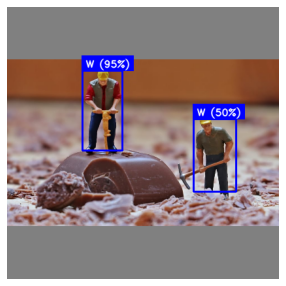

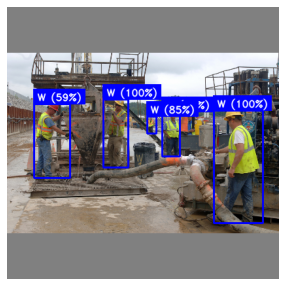

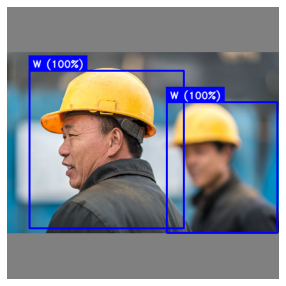

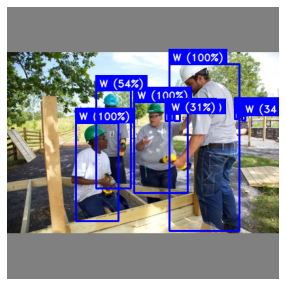

...

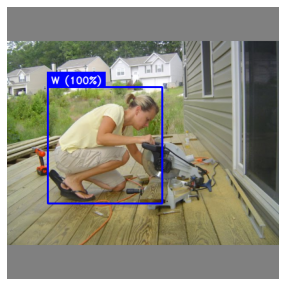

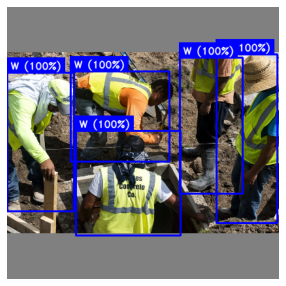

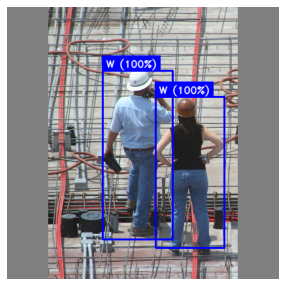

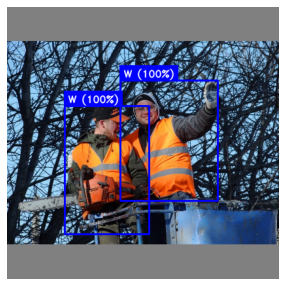

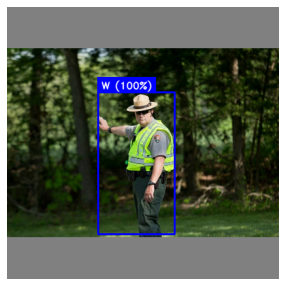

In [18]:
# prepare the model
detect_image()

## **Display Output**

We need to compress the video in order to display large videos. Otherwise you can download it straight from you Google Drive Folder

In [19]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = "/content/pictor-ppe/extras/sample-videos/output/ppe_result_A1.mp4"

# Compressed video path
compressed_path = "/content/pictor-ppe/extras/sample-videos/output/ppe_result_A1_compressed.mp4"

In [20]:
# Process Compress 
os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

0

In [21]:
# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=800 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)